# Business Case:
### Can I predict BAMscore using NBA Combine Test Results? How can it to give insight to athletes + coaches?

## (1) EDA + Cleaning BAM Data
### - Visualize the data
### - Make Observation/Hypothesis
### - Model data in modeling notebook

### Target Audience = High School Basketball Athletes that are trying to plan and play at next level

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as scs
import seaborn as sns
import os
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import maxabs_scale
from sklearn.pipeline import Pipeline

In [2]:
## Name the dataset "df"
df = pd.read_excel('bam_data.xlsx')

In [3]:
df.info()
# See if anything is funky with the data using .info() and the eye test

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 16 columns):
BAMid                 1057 non-null object
Approach Vertical     986 non-null float64
Vertical Jump         1019 non-null float64
3/4 Court sprint      1026 non-null object
4-Way agility         1020 non-null object
Reaction Shuttle      1024 non-null float64
BAMScore              1056 non-null float64
Wingspan              1012 non-null float64
Reach                 1012 non-null float64
Height                1012 non-null float64
Weight                1012 non-null float64
Body Comp             1012 non-null float64
Hand Length           1010 non-null float64
Hand Width            1009 non-null float64
Unnamed: 14           0 non-null float64
Unnamed: 15           1 non-null object
dtypes: float64(12), object(4)
memory usage: 132.5+ KB


In [4]:
# I dont like the looks of Unnamed 14 + 15. Reshape my coding grammer so I can tidy up the data 
df.columns = [column.strip().lower().replace(" ", "_") for column in df.columns]
df.head()

,bamid,approach_vertical,vertical_jump,3/4_court_sprint,4-way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width,unnamed:_14,unnamed:_15
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,7.50,8.25,NaN,NaN
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,7.50,8.75,NaN,NaN
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.00,9.50,NaN,NaN
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,8.25,9.25,NaN,NaN
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,8.00,10.00,NaN,NaN


In [5]:
column_names = ['bamid', '3/4_court_sprint', '4-way_agility', 'unnamed:_15']

for column in df.columns:
    if column in column_names:
        df[column].replace('', 0)
        df[column] = pd.to_numeric(df[column], errors='coerce')
    df[column].fillna(df[column].mean(), inplace=True)
    print(f'{column}: fixed!')

bamid: fixed!
approach_vertical: fixed!
vertical_jump: fixed!
3/4_court_sprint: fixed!
4-way_agility: fixed!
reaction_shuttle: fixed!
bamscore: fixed!
wingspan: fixed!
reach: fixed!
height: fixed!
weight: fixed!
body_comp: fixed!
hand_length: fixed!
hand_width: fixed!
unnamed:_14: fixed!
unnamed:_15: fixed!


In [6]:
df.columns

Index(['bamid', 'approach_vertical', 'vertical_jump', '3/4_court_sprint',
       '4-way_agility', 'reaction_shuttle', 'bamscore', 'wingspan', 'reach',
       'height', 'weight', 'body_comp', 'hand_length', 'hand_width',
       'unnamed:_14', 'unnamed:_15'],
      dtype='object')

In [7]:
df.drop(columns=['unnamed:_14','unnamed:_15'],inplace=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 14 columns):
bamid                1059 non-null float64
approach_vertical    1059 non-null float64
vertical_jump        1059 non-null float64
3/4_court_sprint     1059 non-null float64
4-way_agility        1059 non-null float64
reaction_shuttle     1059 non-null float64
bamscore             1059 non-null float64
wingspan             1059 non-null float64
reach                1059 non-null float64
height               1059 non-null float64
weight               1059 non-null float64
body_comp            1059 non-null float64
hand_length          1059 non-null float64
hand_width           1059 non-null float64
dtypes: float64(14)
memory usage: 116.0 KB


In [9]:
df.columns.isna()
# Check and make sure nulls are gone - looking for all false.

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False])

## EDA

In [10]:
# What's BAMscore even look like? Lets find out - more values?

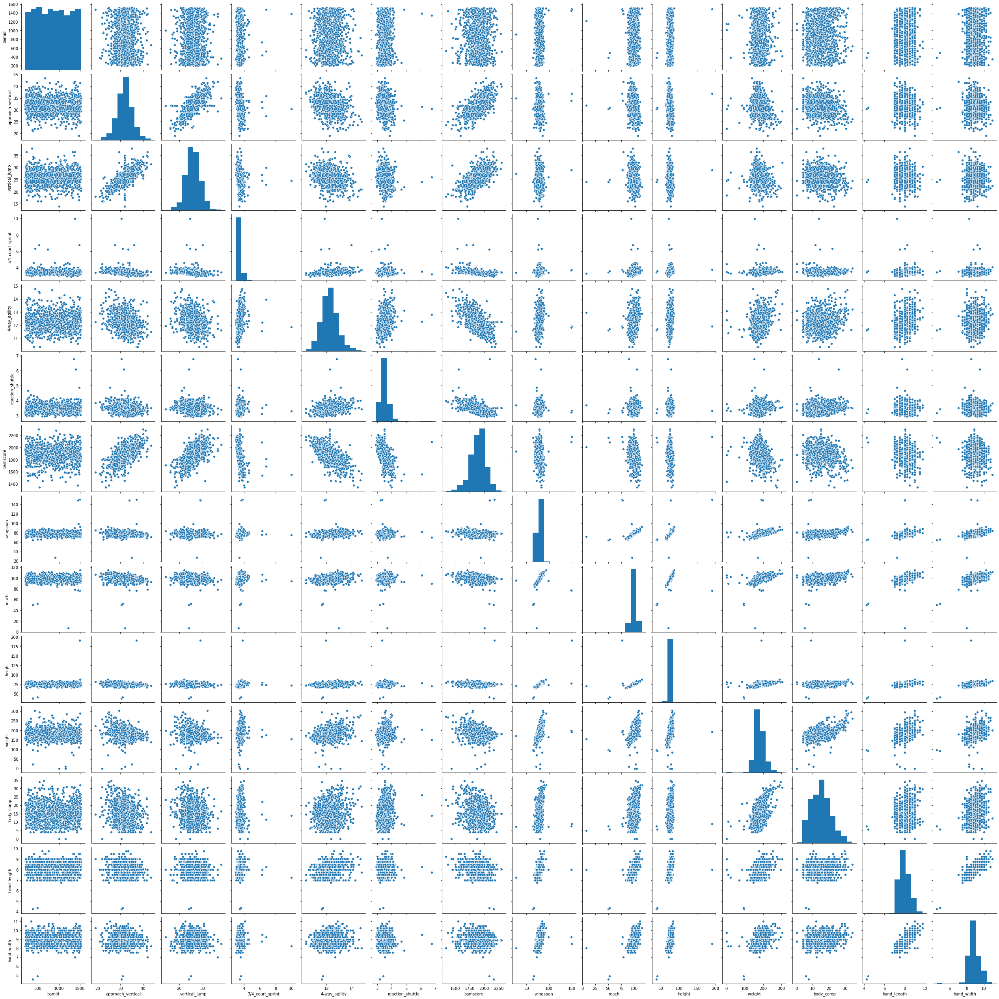

In [11]:
# First lets use the eye test and look at relationships in our data + identify multicollinearity.
sns.pairplot(df)

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



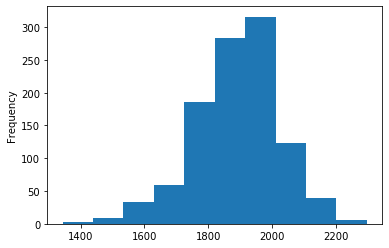

In [12]:
df['bamscore'].plot('hist')

In [13]:
df['bamscore'].describe(),

(count    1059.000000
 mean     1890.976326
 std       134.866028
 min      1343.000000
 25%      1811.000000
 50%      1899.000000
 75%      1981.000000
 max      2298.000000
 Name: bamscore, dtype: float64,)

### BAMscore Range: [1343-2298]
### BAMscore Min: [1343]
### BAMscore Max: [2298]

In [14]:
df['bamscore']
df.head()

,bamid,approach_vertical,vertical_jump,3/4_court_sprint,4-way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width
0,1037.0,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,7.50,8.25
1,656.0,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,7.50,8.75
2,477.0,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.00,9.50
3,1200.0,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,8.25,9.25
4,1501.0,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,8.00,10.00


In [15]:
# Want to look at bam scores relationship to the factors
# I love violin plots because it's easy to see the data

In [16]:
fig1 = px.violin(df, y='bamscore', x='approach_vertical',
                box=True, hover_data=df.columns)
fig2 = px.violin(df, y='bamscore', x='vertical_jump',
                box=True, hover_data=df.columns)
fig3 = px.violin(df, y='bamscore', x='3/4_court_sprint',
                box=True, hover_data=df.columns)
fig4 = px.violin(df, y='bamscore', x='4-way_agility',
                box=True, hover_data=df.columns)
fig5 = px.violin(df, y='bamscore', x='reaction_shuttle',
                box=True, hover_data=df.columns)
fig6 = px.violin(df, y='bamscore', x='wingspan',
                box=True, hover_data=df.columns)
fig7 = px.violin(df, y='bamscore', x='reach',
                 box=True, hover_data=df.columns)
fig8 = px.violin(df, y='bamscore', x='height',
                box=True, hover_data=df.columns)
fig9 = px.violin(df, y='bamscore', x='weight',
                box=True, hover_data=df.columns)
fig10 = px.violin(df, y='bamscore', x='body_comp',
                box=True, hover_data=df.columns)
fig11 = px.violin(df, y='bamscore', x='hand_length',
                box=True, hover_data=df.columns)
fig12 = px.violin(df, y='bamscore', x='hand_width',
                box=True, hover_data=df.columns)
fig1.show()
fig2.show()
fig3.show()
fig4.show()
fig5.show()
fig6.show()
fig7.show()
fig8.show()
fig9.show()
fig10.show()
fig11.show()
fig12.show()

## Observations:
### fig3 - 3/4 court sprint has outlier
### fig4 - 4-way-agility outlier
### fig10 - body_comp - has outlier and 0 values

In [17]:
# I noticed weight and body comp had at least 1 value of 0. So I want to locate these and fix them (replace mean)
# Will do this after split

In [18]:
#Want to look at those 3 again

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



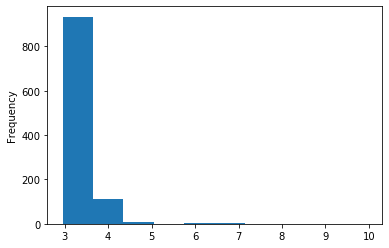

In [19]:
hist3 = df['3/4_court_sprint'].plot('hist')
# outliers

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



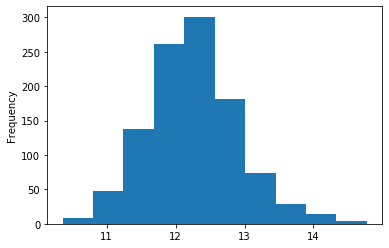

In [20]:
hist4 = df['4-way_agility'].plot('hist')
# more normal

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



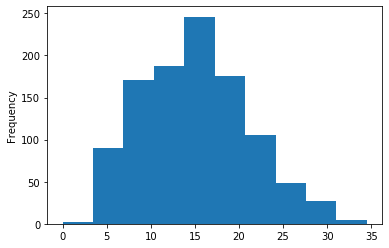

In [21]:
hist10 = df['body_comp'].plot('hist')
# more normal

In [22]:
df.describe()

,bamid,approach_vertical,vertical_jump,3/4_court_sprint,4-way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width
count,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000
mean,858.025568,31.829615,25.860157,3.467047,12.247189,3.505243,1890.976326,78.089797,98.714180,75.094195,180.735820,14.979496,8.049381,8.876189
std,383.415033,3.423395,3.065653,0.335502,0.652726,0.273783,134.866028,5.143227,5.824608,5.128197,28.002496,6.052069,0.533210,0.638452
min,201.000000,19.000000,14.000000,2.950000,10.359000,2.914000,1343.000000,27.000000,7.500000,37.875000,0.000000,0.000000,4.250000,4.500000
25%,526.000000,30.000000,24.000000,3.339500,11.806000,3.348000,1811.000000,75.500000,96.000000,72.750000,165.200000,10.400000,7.750000,8.500000
50%,858.000000,31.829615,25.860157,3.424000,12.244000,3.492000,1899.000000,78.000000,98.714180,75.000000,179.500000,14.979496,8.000000,8.876189
75%,1188.000000,34.000000,28.000000,3.537500,12.658000,3.634000,1981.000000,80.500000,102.000000,77.250000,195.000000,18.900000,8.500000,9.250000
max,1520.000000,43.500000,38.000000,9.954000,14.775000,6.759000,2298.000000,150.000000,115.000000,190.700000,303.400000,34.500000,9.750000,11.000000


In [23]:
df.loc[(df.weight == 0)]
# to use in modeling notebook

,bamid,approach_vertical,vertical_jump,3/4_court_sprint,4-way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width
106,1008.0,30.5,24.5,3.505,12.388,3.372,1879.0,79.25,101.5,76.25,0.0,0.0,8.0,8.75
262,1158.0,22.0,18.5,4.450,13.093,3.767,1438.0,80.50,105.0,80.50,0.0,0.0,9.0,9.75


In [24]:
df.loc[(df.body_comp == 0)]
# to use in modeling notebook

,bamid,approach_vertical,vertical_jump,3/4_court_sprint,4-way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width
106,1008.0,30.5,24.5,3.505,12.388,3.372,1879.0,79.25,101.5,76.25,0.0,0.0,8.0,8.75
262,1158.0,22.0,18.5,4.450,13.093,3.767,1438.0,80.50,105.0,80.50,0.0,0.0,9.0,9.75


## Observation and hypothesis

In [25]:
# Want to clean 0 values in data so outliers are taken out and will do this after I split data
# Outliers are present. 3/4 court sprint apparent
# Hypothesis is the combine tests are more important than body measurements, need to focus on those

In [26]:
df.to_csv("bam_data.csv")